## Seasonal & Temporal Analysis of Band Depth in EMM Daytime/Nighttime Data

**EMIRS** (Emirates Mars Infrared Spectrometer) is an infrared spectrometer onboard the Emirates Mars Mission (EMM) that measures radiances. These radiances are processed by the EMM Science team to generate Level 3 data products containing emissivity. We can leverage these emissivity measurements to investigate the spectral signature of Methane ($\text{CH}_4$) at the 1308 cm$^{-1}$ wavenumber.

**Band Depth** is a valuable metric for quantifying the absorption feature at this specific channel and identifying potential spatial and temporal patterns.

The Band Depth (BD) of a spectrum is calculated as:

$\qquad \text{BD} = 1 - \frac{\text{Emissivity}_{\text{Methane Channel}}}{\text{Average Adjacent Channel Emissivity}}$

Where the Average Adjacent Channel Emissivity is determined by:

$\qquad \text{Average Adjacent Channel Emissivity} = \frac{\text{Emissivity}_{\text{Adjacent Left Channel}} + \text{Emissivity}_{\text{Adjacent Right Channel}}}{2}$

### Analysis Approach

Our methodology for analyzing Band Depth involves the following steps:

1.  **Compute Band Depth:** Calculate the BD for every available spectrum in the dataset.
2.  **Temporal Analysis:** Plot the computed BD as a function of Martian Solar Longitude (Ls) and Latitude to examine seasonal and latitudinal variations.
3.  **Spatial Analysis:** For different Martian seasons, generate BD maps (as a function of Latitude and Longitude) to identify spatial distributions and potential source regions.
4.  **Pattern Recognition and Interpretation:** Analyze the resulting plots and maps to discern if any discernible patterns emerge beyond random noise. We specifically look for patterns that might correlate with known distributions of other atmospheric constituents (e.g., water vapor) or surface properties (e.g., albedo, thermal inertia). Identifying such correlations would suggest that the observed BD variations might be driven by factors other than methane absorption.

    * For instance, a BD pattern closely resembling the known distribution of water vapor would indicate that our BD calculation might be sensitive to water vapor absorption at nearby wavelengths.
    * Similarly, spatial patterns in BD that align with surface albedo or thermal inertia maps could suggest a surface-related influence on the measured emissivities.

### Data Source

This analysis is performed on a carefully curated subset of EMM/EMIRS spectra, specifically cleaned and processed for our research paper titled 'Search for Methane on Mars'. We utilized Level 3 emissivity and temperature data accessed through L3ATM and L3EMISS files.

The raw spectra underwent a series of rigorous noise reduction procedures, including:

* Applying cutoffs on emission angle ($\leq 70^\circ$).
* Filtering based on emissivity values.
* Eliminating spectra with significant ripples in emissivity readings.
* Applying a threshold to a calculated noise parameter.
* Employing statistical clustering (k-means) on the filtered data to further isolate high-quality spectra.

The detailed implementation of these noise reduction steps is documented in the programs used for this analysis.

### Observed Patterns

Preliminary analysis has revealed some patterns that appear to correlate with the known distributions of **water vapor** and **surface ice**. Further investigation is underway to quantify these relationships and disentangle potential methane signals from these confounding factors.


### Reference Sources for Analysis

Some patterns observed for Water vapour and Ice 

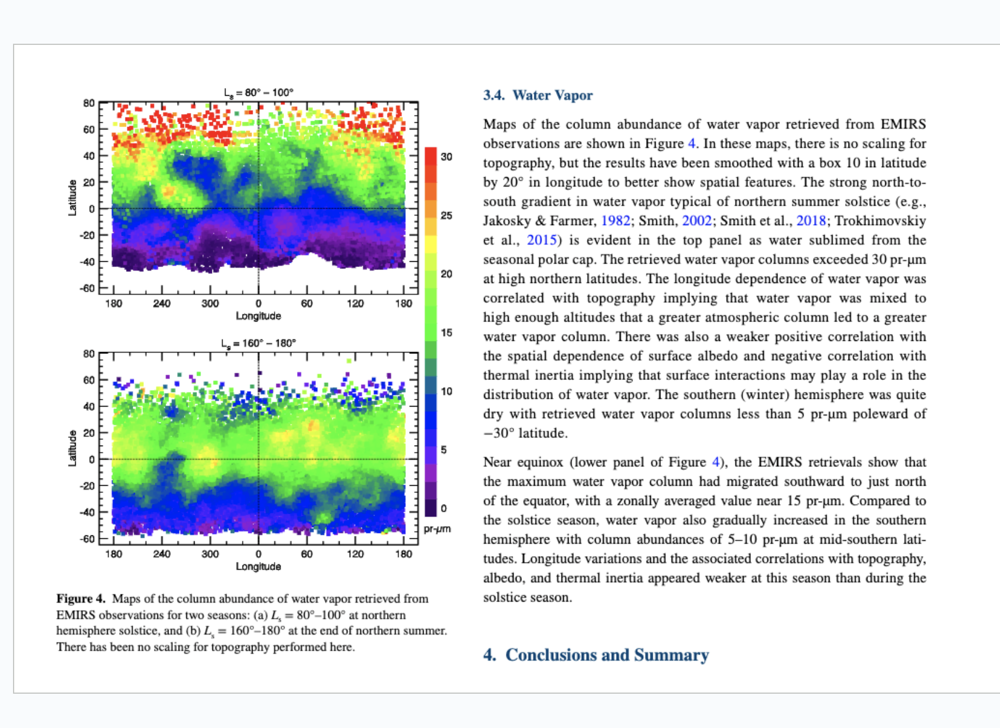

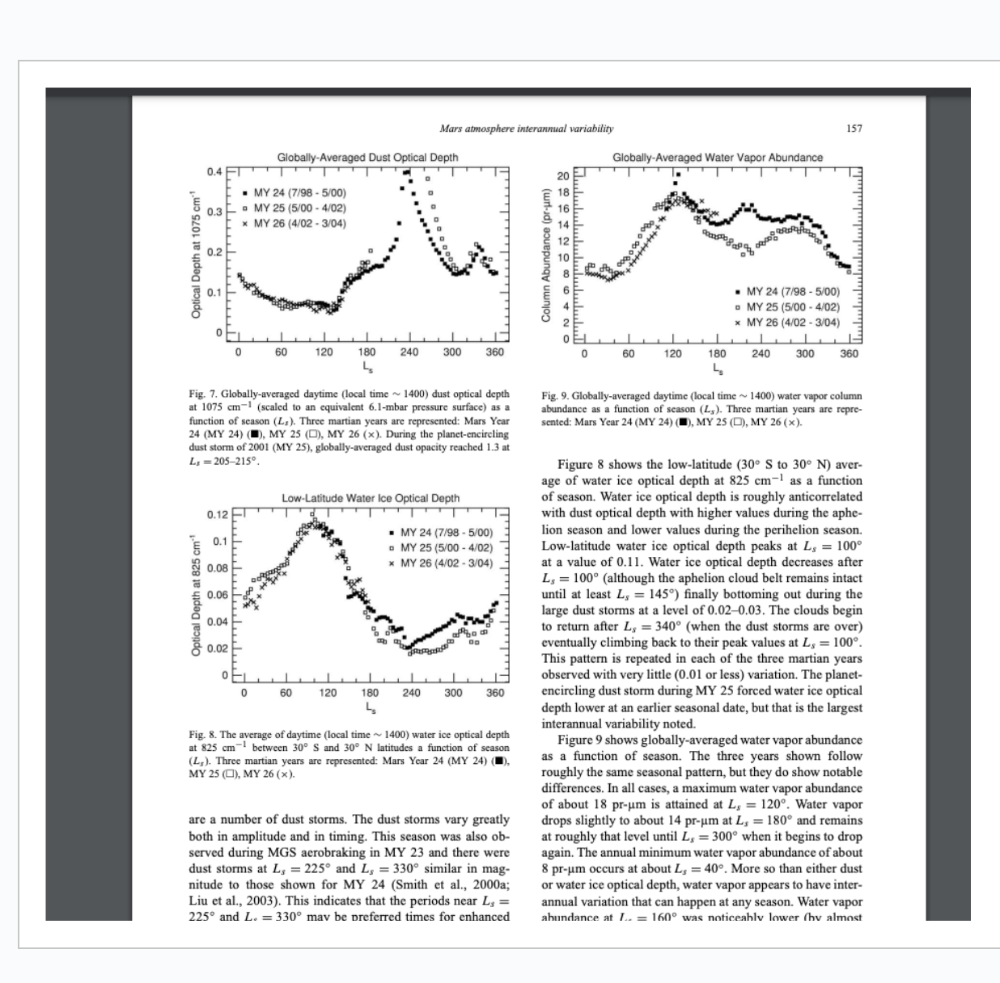

In [49]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import scienceplots

import seaborn as sns


In [2]:
# matplotlib style set

plt.style.use(['science', 'notebook'])

In [3]:
path = '/scratch/pk97/20_EMM_methane_analysis/data/'
filename_day = 'emm_cleaned_day_clustered.csv'
filename_night = 'emm_cleaned_night_clustered.csv'
df_day = pd.read_csv(path + filename_day)
df_night = pd.read_csv(path + filename_night)
len(df_day), len(df_night)

#df_day = pd.read_csv('/scratch/pk97/20_Methane Analysis/data/emm_day_cleaned_dbscan.csv')
#df_night = pd.read_csv('/scratch/pk97/20_Methane Analysis/data/emm_night_cleaned_dbscan.csv')
#df_day.shape, df_night.shape

(192249, 34312)

In [6]:
#df = pd.concat([df_day, df_night], ignore_index=True)
#df.head()

In [4]:
emiss_cols = df_day.columns.to_list()[19:-2]

# Usually noise is higher in the first and last columns
# Therefore we select a section of the columns to further analyse - 348 to 1318

emiss_cols = emiss_cols[32:125] 

methane_cols = emiss_cols[81:]
print(f'no of methane channels are - {len(methane_cols):.0f} and the columns are {methane_cols}')

no of methane channels are - 12 and the columns are ['1192.0', '1202.0', '1213.0', '1223.0', '1234.0', '1245.0', '1255.0', '1266.0', '1276.0', '1287.0', '1297.0', '1308.0']


### To calculate the BD 
we recognise the channels we will use the middle is methane channel 

In [7]:
methane_ch = "1308.0"
before_ch  = "1297.0"
after_ch   = "1318.0"

Calculate the methane band depth = emissivity of methane channel / average of emissivity of 2 channels next to methane channel


In [9]:
df_day['BD'] = 1 - (df_day[methane_ch]/((df_day[before_ch]+df_day[after_ch])/2))
df_night['BD'] = 1 - (df_night[methane_ch]/((df_night[before_ch]+df_night[after_ch])/2))
#df['BD'] = 1 - (df[methane_ch]/((df[before_ch]+df[after_ch])/2))

In [10]:
df_day[df_day['BD']>=0][[before_ch, methane_ch, after_ch, 'BD']].mean()

1297.0    1.031993
1308.0    1.012183
1318.0    1.018861
BD        0.012828
dtype: float64

A positive BD indicates a dip in the methane channel

Text(0.5, 1.0, 'A View of some spectra with a positive BD')

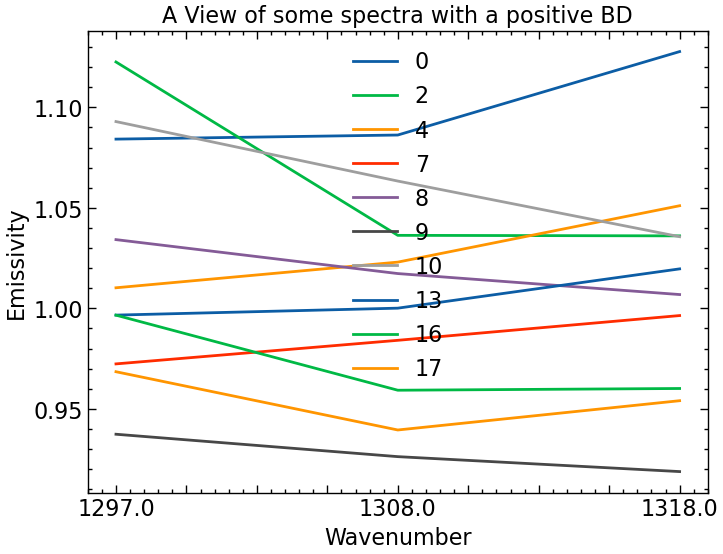

In [11]:
df_day[df_day['BD']>=0][[before_ch, methane_ch, after_ch]].T.iloc[:, 0: 10].plot()
plt.xlabel("Wavenumber")
plt.ylabel("Emissivity")
plt.title("A View of some spectra with a positive BD")

Text(0.5, 1.0, 'A View of some spectra with a negative BD')

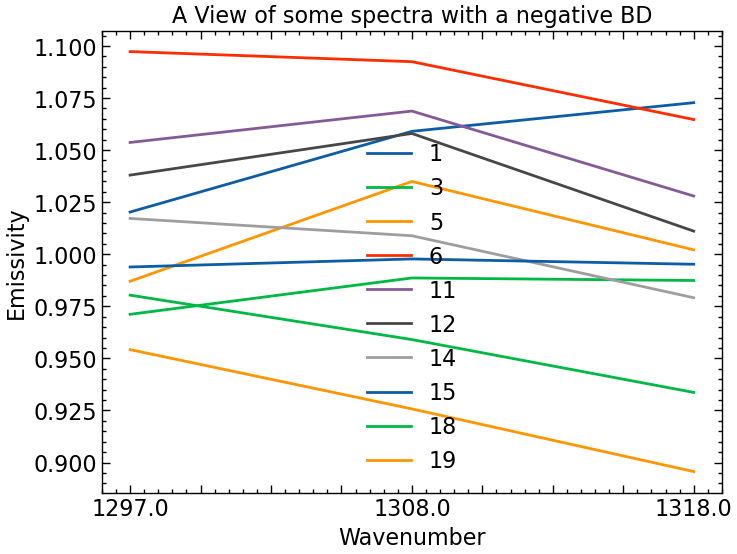

In [17]:
df_day[df_day['BD']<0][[before_ch, methane_ch, after_ch]].T.iloc[:, 0: 10].plot()
plt.xlabel("Wavenumber")
plt.ylabel("Emissivity")
plt.title("A View of some spectra with a negative BD")

Average BD in the daytime data

Text(0.5, 1.0, 'A View of the mean positive BD in EMM daytime data\nTotal Spectra:91673')

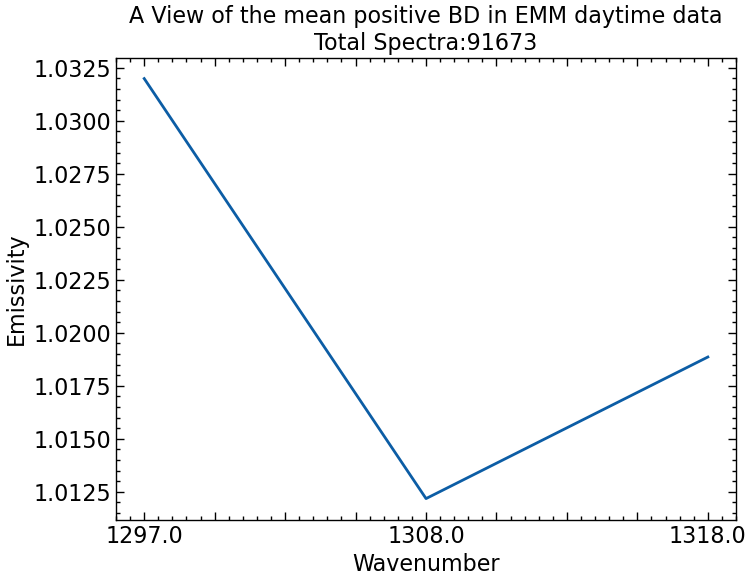

In [18]:
df_day[df_day['BD']>=0][[before_ch, methane_ch, after_ch]].mean().plot()
plt.xlabel("Wavenumber")
plt.ylabel("Emissivity")
plt.title(f"A View of the mean positive BD in EMM daytime data\nTotal Spectra:{len(df_day[df_day['BD']>=0])}")

Text(0.5, 1.0, 'A View of the mean negative BD in EMM daytime data\nTotal Spectra:100576')

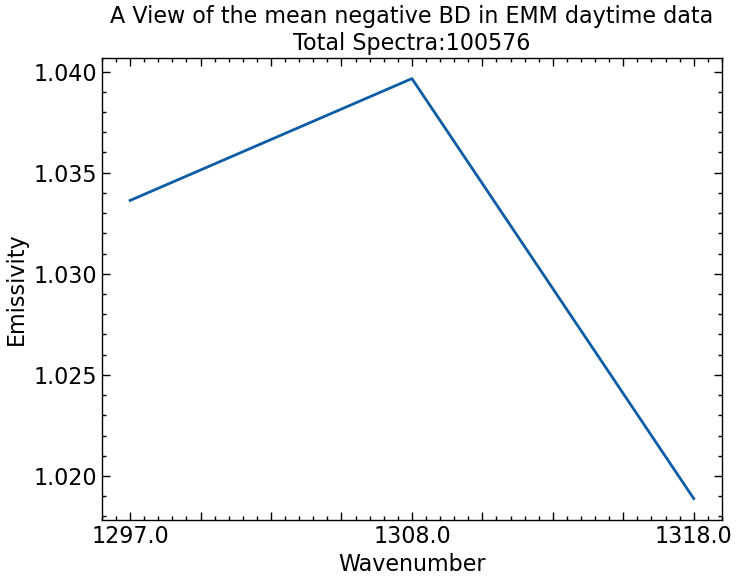

In [19]:
df_day[df_day['BD']<0][[before_ch, methane_ch, after_ch]].mean().plot()
plt.xlabel("Wavenumber")
plt.ylabel("Emissivity")
plt.title(f"A View of the mean negative BD in EMM daytime data\nTotal Spectra:{len(df_day[df_day['BD']<0])}")

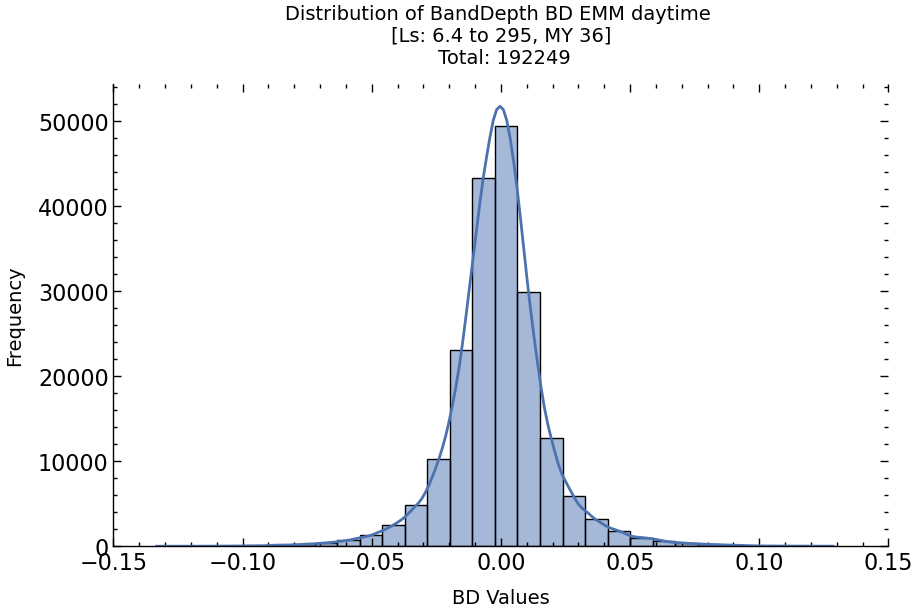

In [20]:
# Create the histogram
plt.figure(figsize=(10, 6))
ax = sns.histplot(df_day['BD'], bins=30, kde=True, color="#4C72B0", edgecolor="black")

# Improve aesthetics
ax.set_title(f"Distribution of BandDepth BD EMM daytime \n [Ls: 6.4 to 295, MY 36] \n Total: {len(df_day)}", 
             fontsize=14, pad=15)
ax.set_xlabel("BD Values", fontsize=14, labelpad=10)
ax.set_ylabel("Frequency", fontsize=14, labelpad=10)

ax.set_xlim([-0.15, 0.15])
# Remove top and right spines for a cleaner look
sns.despine()

# Show the plot
plt.show()

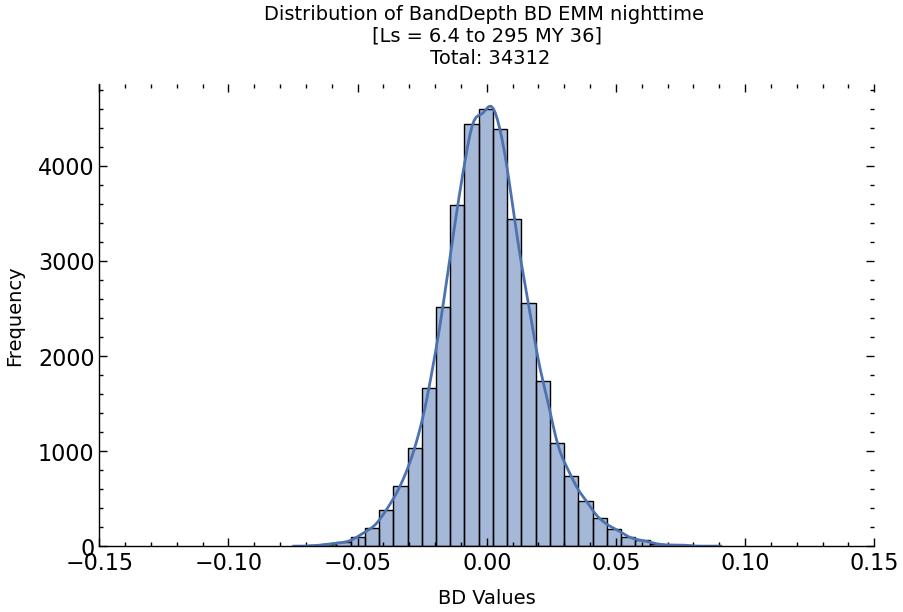

In [21]:
# Create the histogram
plt.figure(figsize=(10, 6))
ax = sns.histplot(df_night['BD'], bins=30, kde=True, color="#4C72B0", edgecolor="black")

# Improve aesthetics
ax.set_title(f"Distribution of BandDepth BD EMM nighttime \n [Ls = 6.4 to 295 MY 36] \n Total: {len(df_night)}", 
             fontsize=14, pad=15)
ax.set_xlabel("BD Values", fontsize=14, labelpad=10)
ax.set_ylabel("Frequency", fontsize=14, labelpad=10)

ax.set_xlim([-0.15, 0.15])

# Remove top and right spines for a cleaner look
sns.despine()

# Show the plot
plt.show()

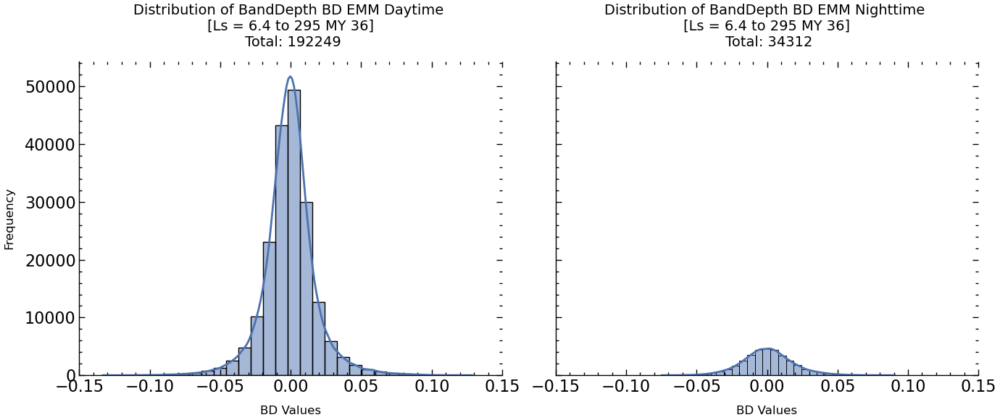

In [40]:
# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Daytime Histogram
sns.histplot(df_day['BD'], bins=30, kde=True, color="#4C72B0", edgecolor="black", ax=axes[0])
axes[0].set_title(f"Distribution of BandDepth BD EMM Daytime \n [Ls = 6.4 to 295 MY 36] \n Total: {len(df_day)}", 
                  fontsize=14, pad=15)
axes[0].set_xlabel("BD Values", fontsize=12, labelpad=10)
axes[0].set_ylabel("Frequency", fontsize=12, labelpad=10)
axes[0].set_xlim([-0.15, 0.15])

# Nighttime Histogram
sns.histplot(df_night['BD'], bins=30, kde=True, color="#4C72B0", edgecolor="black", ax=axes[1])
axes[1].set_title(f"Distribution of BandDepth BD EMM Nighttime \n [Ls = 6.4 to 295 MY 36] \n Total: {len(df_night)}", 
                  fontsize=14, pad=15)
axes[1].set_xlabel("BD Values", fontsize=12, labelpad=10)
axes[1].set_ylabel("Frequency", fontsize=12, labelpad=10)
axes[1].set_xlim([-0.15, 0.15])

# Improve aesthetics
sns.despine()
plt.tight_layout()

# Show the plot
plt.show()

## Seasonal Variation of BD as a function of Latitude and Longitude

We use some maps to find any patterns in comparison. For example the pattern of albedo for Mars are 

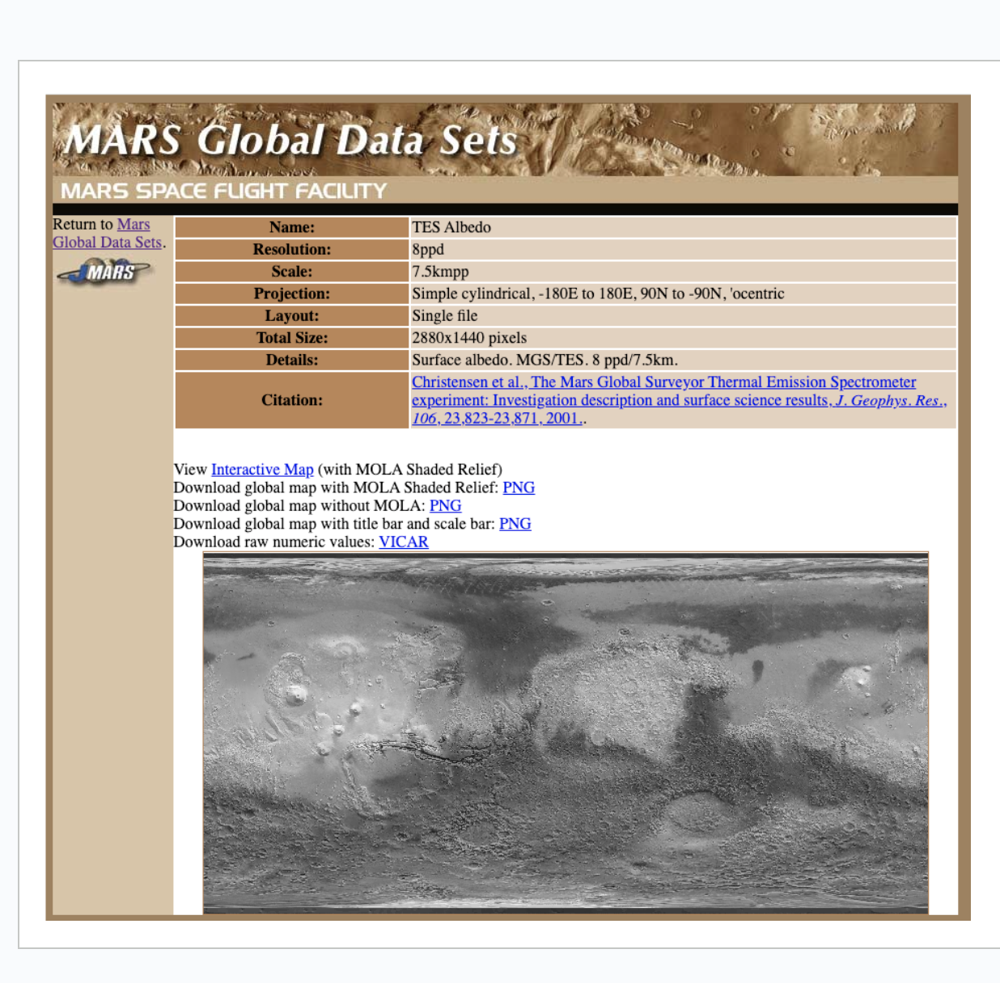

Albedo calculated from EMM data at the Mars Research Lab

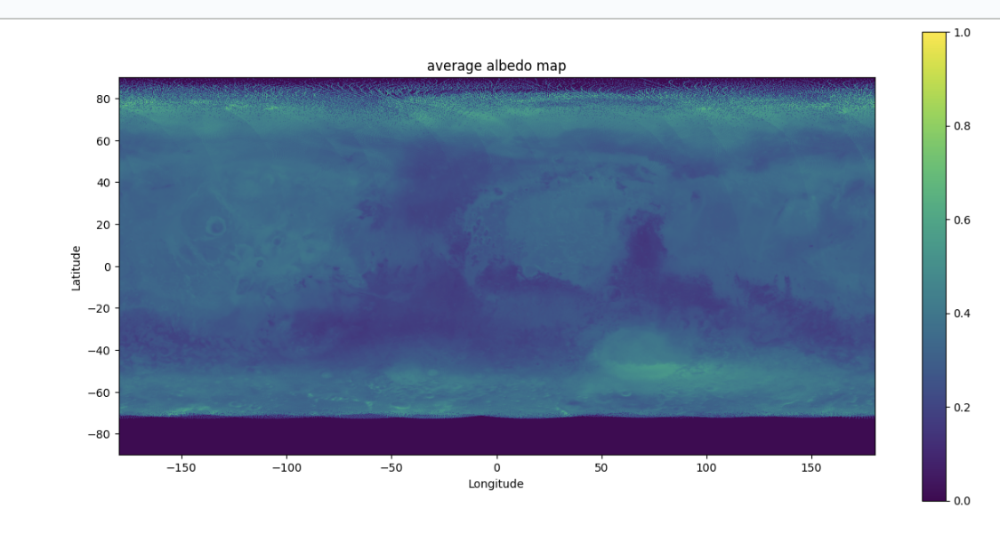

First we check for all data

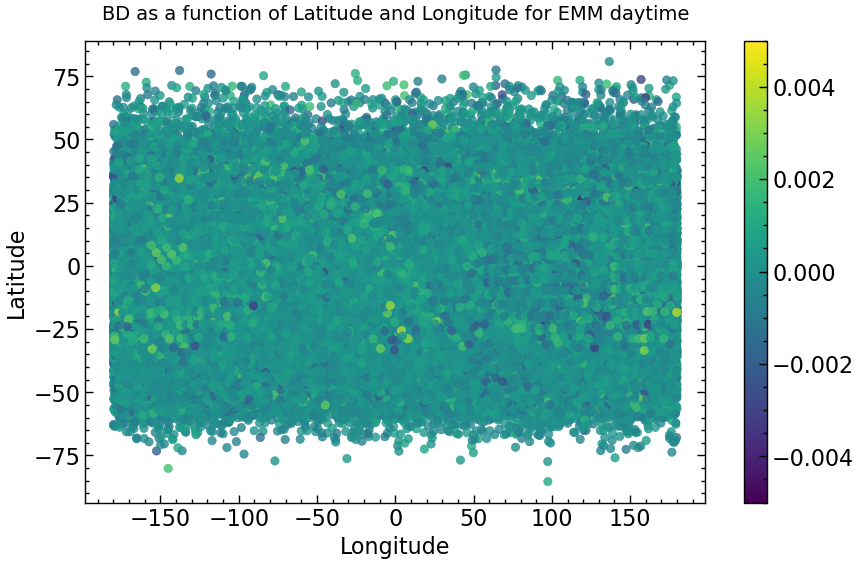

In [43]:
plt.figure(figsize=(10, 6))
ax = sns.scatterplot(data = df_day, x = 'longitude', y = 'latitude', hue='BD', 
                     palette = 'viridis', ec = None, alpha = 0.8)
ax.set_title("BD as a function of Latitude and Longitude for EMM daytime", fontsize=14, pad=15)
norm = plt.Normalize(vmin=-0.005, vmax=0.005)
sm = plt.cm.ScalarMappable(cmap = 'viridis' , norm=norm)
cbar = plt.colorbar(sm, ax=ax)
#cbar.set_label("Surface Temperature (tsurf)")  
ax.get_legend().remove()


plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()

Observation: No observable Pattern
Continue to analyse over season

DAY

In [26]:
# Define conditions for Solar Longitude Values

con_ls0 = (df_day['l_sub_s']>=355)|(df_day['l_sub_s']<=5)
con_ls90 = (df_day['l_sub_s']>=85)&(df_day['l_sub_s']<=95)
con_ls180 = (df_day['l_sub_s']>=175)&(df_day['l_sub_s']<=185)
con_ls270 = (df_day['l_sub_s']>=265)&(df_day['l_sub_s']<=275)

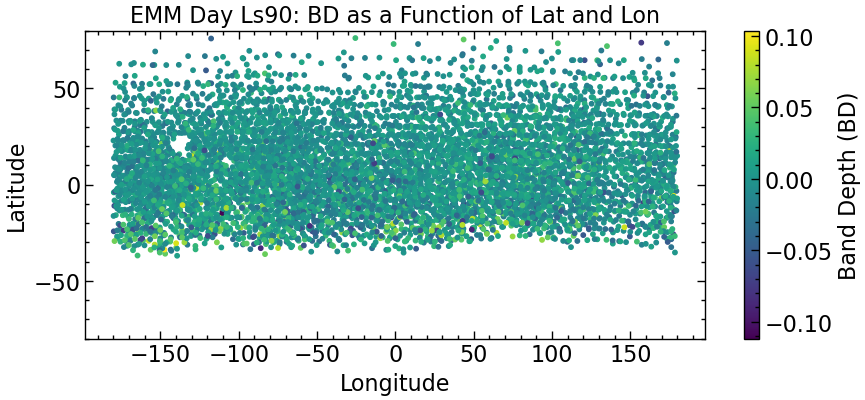

In [31]:
# LS 90 - Solar Longitude 90 +- 5 degrees

plt.figure(figsize=(10,4))
plt.scatter(df_day[con_ls90]['longitude'], df_day[con_ls90]['latitude'],
            c=df_day[con_ls90]['BD'], cmap='viridis', s=10)
plt.colorbar(label='Band Depth (BD)')
plt.xlabel('Longitude') # Ls (Solar 
plt.ylabel('Latitude')
plt.ylim([-80, 80])
plt.title('EMM Day Ls90: BD as a Function of Lat and Lon')
plt.show()

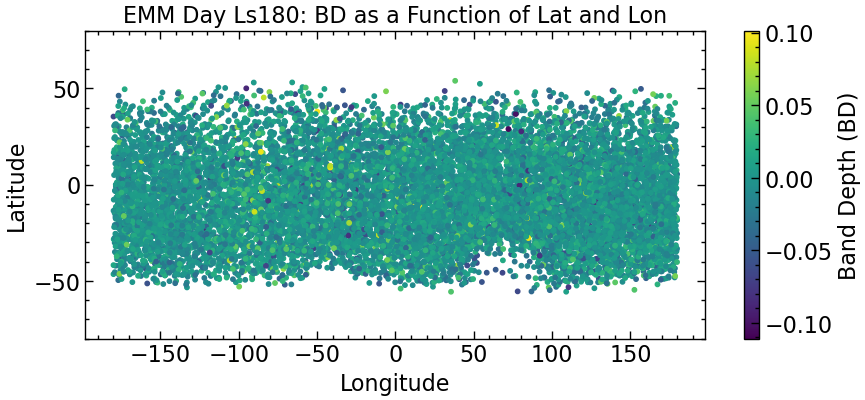

In [32]:
# Ls 180 +- 5

plt.figure(figsize=(10,4))
plt.scatter(df_day[con_ls180]['longitude'], df_day[con_ls180]['latitude'],
            c=df_day[con_ls180]['BD'], cmap='viridis', s=10)
plt.colorbar(label='Band Depth (BD)')
plt.xlabel('Longitude') # Ls (Solar 
plt.ylabel('Latitude')
plt.ylim([-80, 80])
plt.title('EMM Day Ls180: BD as a Function of Lat and Lon')
plt.show()

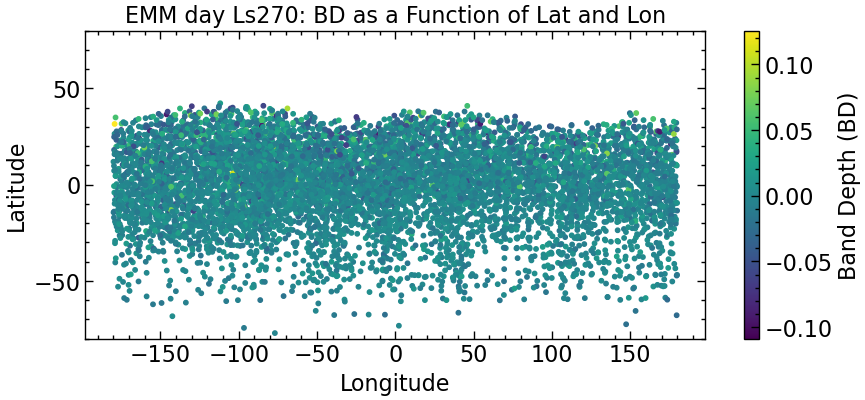

In [33]:
# Ls 270 +- 5

plt.figure(figsize=(10,4))
plt.scatter(df_day[con_ls270]['longitude'], df_day[con_ls270]['latitude'],
            c=df_day[con_ls270]['BD'], cmap='viridis', s=10)
plt.colorbar(label='Band Depth (BD)')
plt.xlabel('Longitude') # Ls (Solar 
plt.ylabel('Latitude')
plt.ylim([-80, 80])
plt.title('EMM day Ls270: BD as a Function of Lat and Lon')
plt.show()

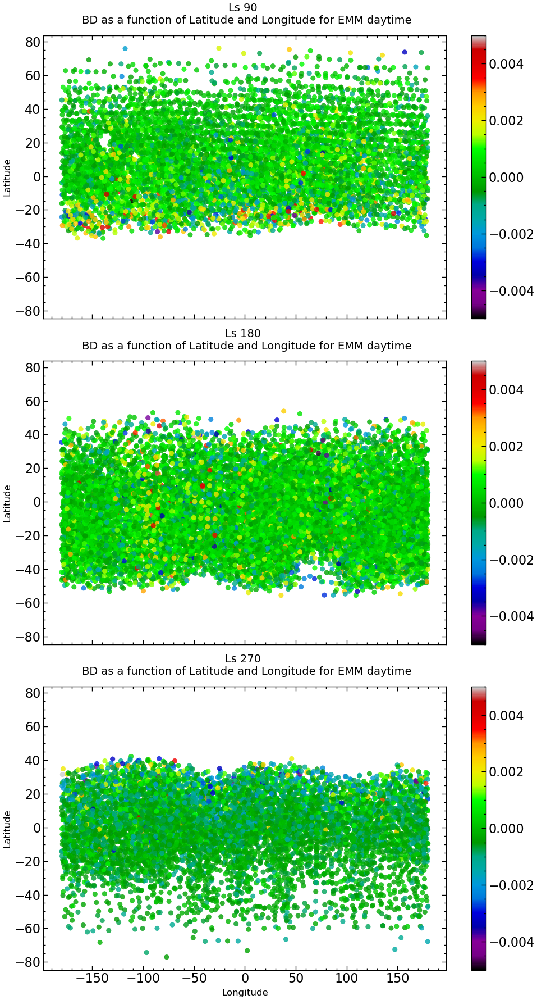

In [30]:
import matplotlib.colors as mcolors
# Create the figure and subplots (1 column, 3 rows)
fig, axes = plt.subplots(3, 1, figsize=(10, 18), sharex=True, sharey=True)

# Define colormap normalization
norm = mcolors.Normalize(vmin=-0.005, vmax=0.005)
cmap = 'nipy_spectral'

# First subplot: Ls 90
ax1 = sns.scatterplot(data=df_day[con_ls90], x='longitude', y='latitude', hue='BD', 
                      palette=cmap, ec=None, alpha=0.8, ax=axes[0])
axes[0].set_title("Ls 90 \n BD as a function of Latitude and Longitude for EMM daytime", fontsize=14, pad=15)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ax=axes[0])
axes[0].get_legend().remove()

# Second subplot: Ls 180
ax2 = sns.scatterplot(data=df_day[con_ls180], x='longitude', y='latitude', hue='BD', 
                      palette=cmap, ec=None, alpha=0.8, ax=axes[1])
axes[1].set_title("Ls 180 \n BD as a function of Latitude and Longitude for EMM daytime", fontsize=14, pad=15)
cbar = plt.colorbar(sm, ax=axes[1])
axes[1].get_legend().remove()

# Third subplot: Ls 270
ax3 = sns.scatterplot(data=df_day[con_ls270], x='longitude', y='latitude', hue='BD', 
                      palette=cmap, ec=None, alpha=0.8, ax=axes[2])
axes[2].set_title("Ls 270 \n BD as a function of Latitude and Longitude for EMM daytime", fontsize=14, pad=15)
cbar = plt.colorbar(sm, ax=axes[2])
axes[2].get_legend().remove()

# Set shared axis labels
for ax in axes:
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)

# Improve layout
plt.tight_layout()

# Show plot
plt.show()

NIGHT

In [35]:
con_ls0_n = (df_night['l_sub_s']>=355)|(df_night['l_sub_s']<=5)
con_ls90_n = (df_night['l_sub_s']>=85)&(df_night['l_sub_s']<=95)
con_ls180_n = (df_night['l_sub_s']>=175)&(df_night['l_sub_s']<=185)
con_ls270_n = (df_night['l_sub_s']>=265)&(df_night['l_sub_s']<=275)

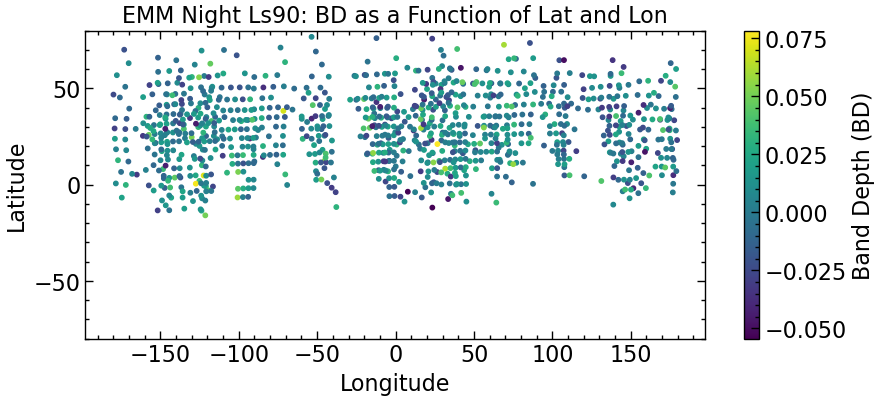

In [36]:
# Ls 90 +-5

plt.figure(figsize=(10,4))
plt.scatter(df_night[con_ls90_n]['longitude'], df_night[con_ls90_n]['latitude'],
            c=df_night[con_ls90_n]['BD'], cmap='viridis', s=10)
plt.colorbar(label='Band Depth (BD)')
plt.xlabel('Longitude') # Ls (Solar 
plt.ylabel('Latitude')
plt.ylim([-80, 80])
plt.title('EMM Night Ls90: BD as a Function of Lat and Lon')
plt.show()

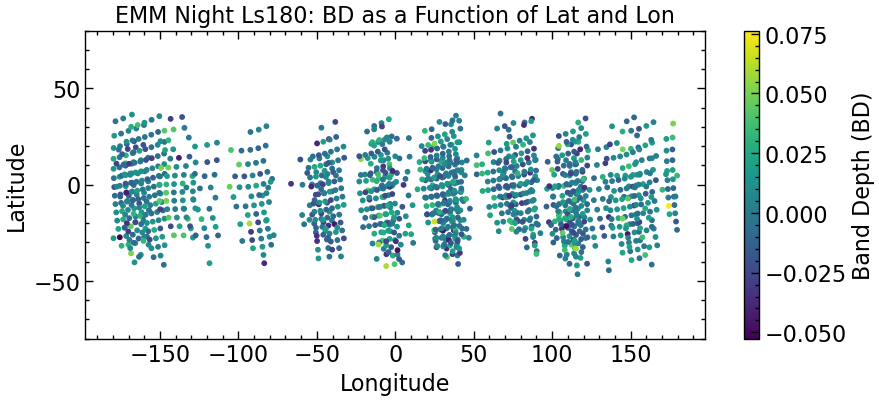

In [37]:
# Ls 180 +-5 

plt.figure(figsize=(10,4))
plt.scatter(df_night[con_ls180_n]['longitude'], df_night[con_ls180_n]['latitude'],
            c=df_night[con_ls180_n]['BD'], cmap='viridis', s=10)
plt.colorbar(label='Band Depth (BD)')
plt.xlabel('Longitude') # Ls (Solar 
plt.ylabel('Latitude')
plt.ylim([-80, 80])
plt.title('EMM Night Ls180: BD as a Function of Lat and Lon')
plt.show()

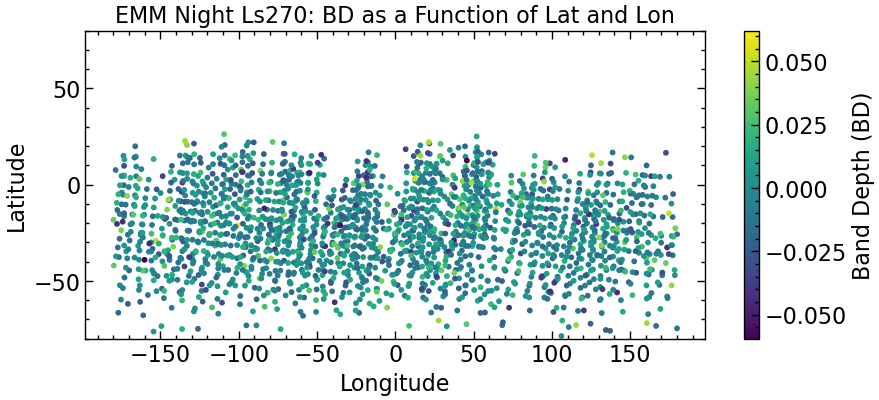

In [38]:
# Ls 270 +- 5

plt.figure(figsize=(10,4))
plt.scatter(df_night[con_ls270_n]['longitude'], df_night[con_ls270_n]['latitude'],
            c=df_night[con_ls270_n]['BD'], cmap='viridis', s=10)
plt.colorbar(label='Band Depth (BD)')
plt.xlabel('Longitude') # Ls (Solar 
plt.ylabel('Latitude')
plt.ylim([-80, 80])
plt.title('EMM Night Ls270: BD as a Function of Lat and Lon')
plt.show()

## Seasonal Variation of BD as a function of Ls and Latitude 

Some previously captured variability in Water Vapour content is given below. We want to search for some similar or opposite patterns in the BD as well. 

Smith 2021: EMIRS Seasonal Variation of Water vapour as a function of Ls and Latitude 

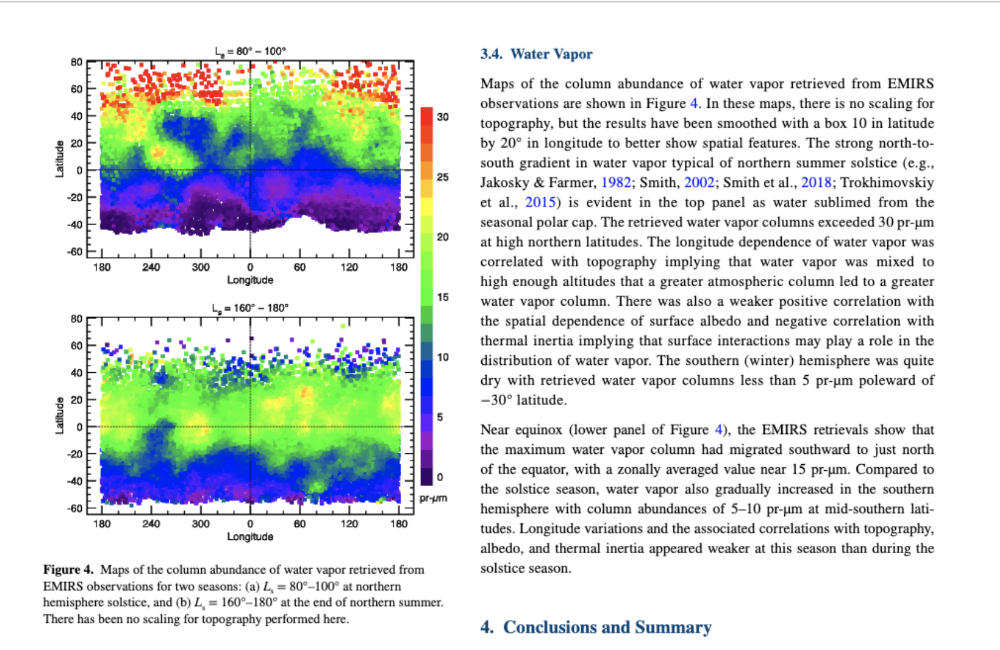 

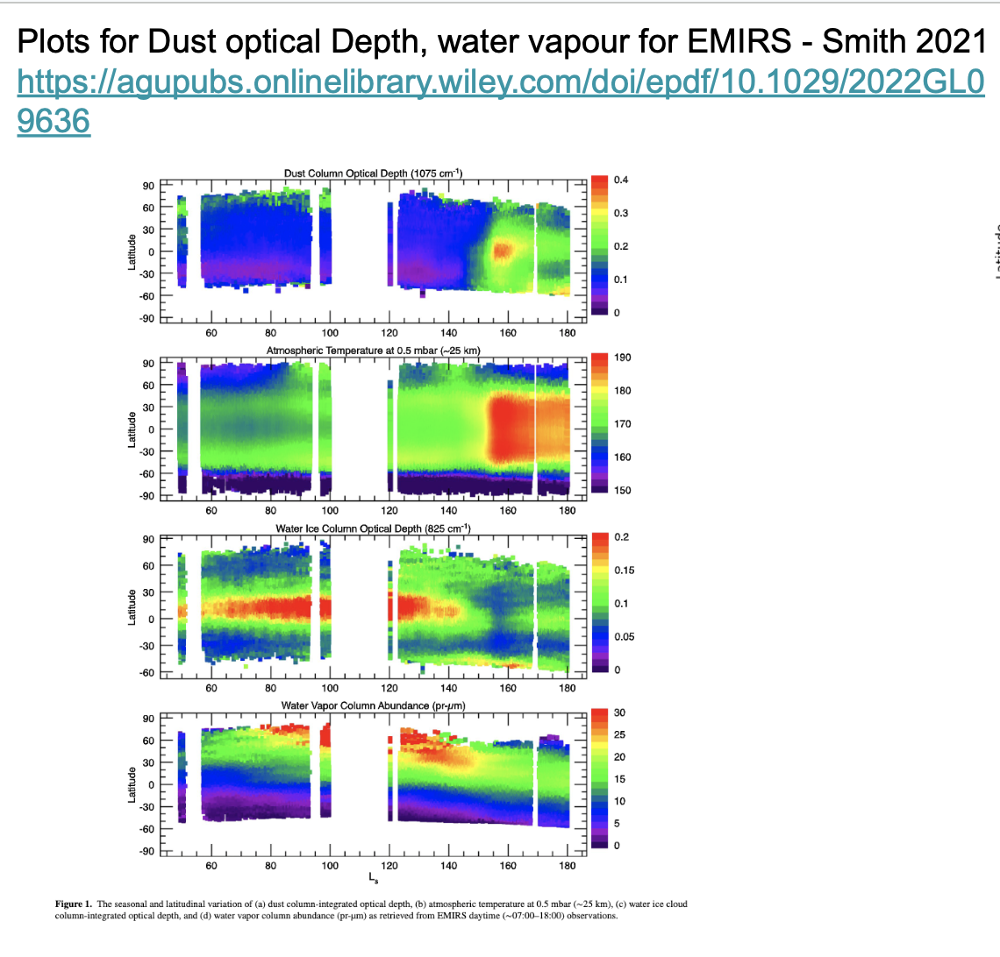 


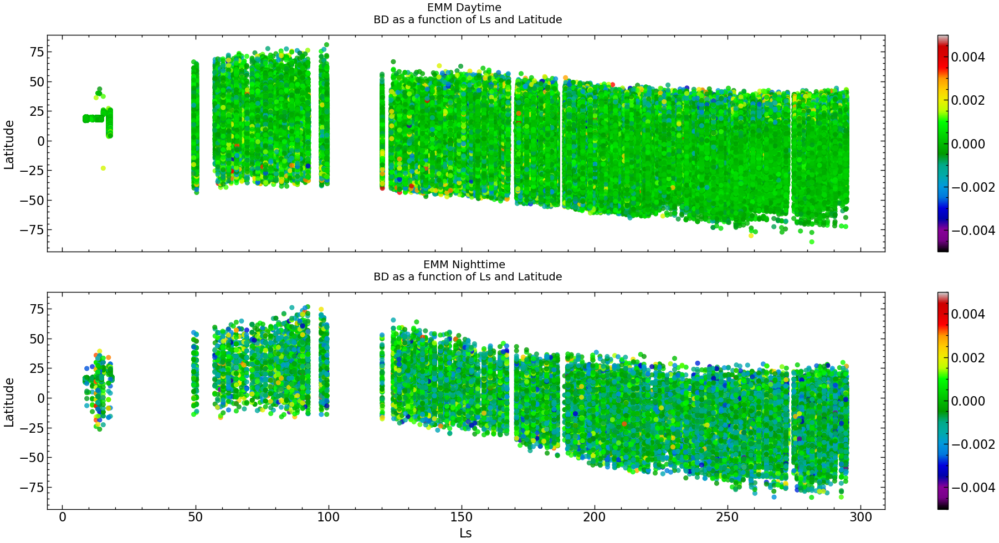

In [39]:
fig, axes = plt.subplots(2, 1, figsize=(20, 10), sharex=True, sharey=True)

# Daytime plot
ax = sns.scatterplot(data=df_day, x='l_sub_s', y='latitude', hue='BD',
                     palette='nipy_spectral', ec=None, alpha=0.8, ax=axes[0])
ax.set_title("EMM Daytime \n BD as a function of Ls and Latitude", fontsize=14, pad=15)
norm = plt.Normalize(vmin=-0.005, vmax=0.005)
sm = plt.cm.ScalarMappable(cmap='nipy_spectral', norm=norm)
cbar = plt.colorbar(sm, ax=axes[0])
# cbar.set_label("Surface Temperature (tsurf)")
ax.get_legend().remove()
ax.set_xlabel('Ls')
ax.set_ylabel('Latitude')

# Nighttime plot
ax = sns.scatterplot(data=df_night, x='l_sub_s', y='latitude', hue='BD',
                     palette='nipy_spectral', ec=None, alpha=0.8, ax=axes[1])
ax.set_title("EMM Nighttime \n BD as a function of Ls and Latitude", fontsize=14, pad=15)
cbar = plt.colorbar(sm, ax=axes[1])
# cbar.set_label("Surface Temperature (tsurf)")
ax.get_legend().remove()
ax.set_xlabel('Ls')
ax.set_ylabel('Latitude')

plt.tight_layout()
plt.show()

In [41]:
con80_100 = (df_day['l_sub_s'] >= 80) & (df_day['l_sub_s'] <= 100)
con160_180 = (df_day['l_sub_s'] >= 160) & (df_day['l_sub_s'] <= 180)
con80_100_n = (df_night['l_sub_s'] >= 80) & (df_night['l_sub_s'] <= 100)
con160_180_n = (df_night['l_sub_s'] >= 160) & (df_night['l_sub_s'] <= 180)


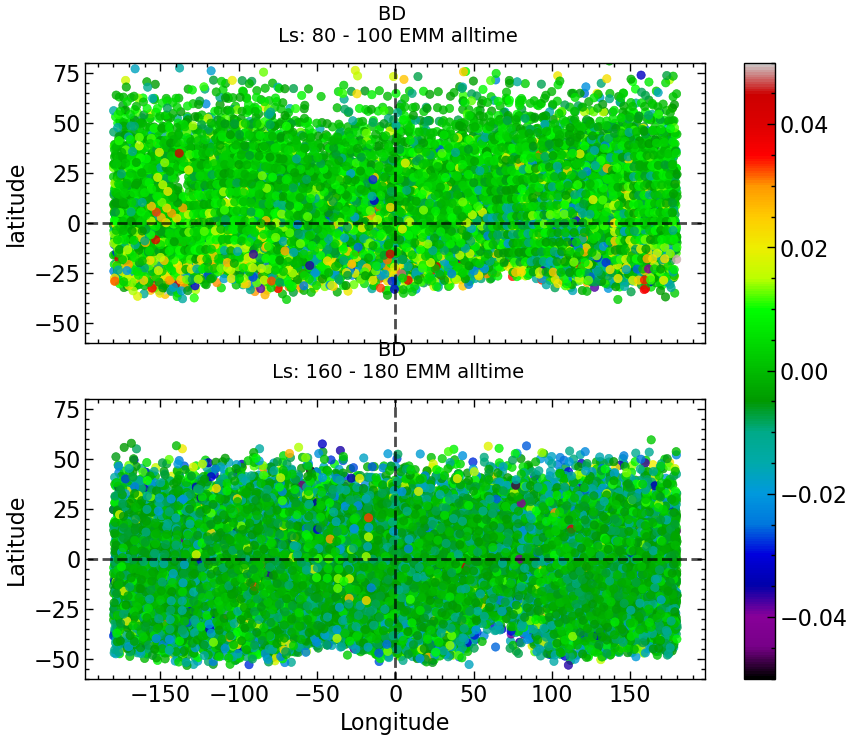

In [42]:
fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True, sharey=True) 

#plt.figure(figsize=(10, 6))
axes[0] = sns.scatterplot(data = df_day[con80_100], x = 'longitude', y = 'latitude', hue='BD', 
                     palette = 'nipy_spectral', ec = None, alpha = 0.8, ax = axes[0])
axes[0].set_title("BD \n Ls: 80 - 100 EMM alltime", fontsize=14, pad=15)
axes[0].axvline(x = 0, ymin = -60, ymax = 80, color = 'black', alpha = 0.7, ls = '--')
axes[0].axhline(y = 0, xmin = -180, xmax = 180, color = 'black', alpha = 0.7, ls = '--')
#cbar.set_label("Surface Temperature (tsurf)")  
axes[0].set_ylim([-60, 80])
axes[0].get_legend().remove()

axes[1] = sns.scatterplot(data = df_day[con160_180], x = 'longitude', y = 'latitude', hue='BD', 
                     palette = 'nipy_spectral', ec = None, alpha = 0.8, ax = axes[1])
axes[1].set_title("BD \n Ls: 160 - 180 EMM alltime", fontsize=14, pad=15)
axes[1].axvline(x = 0, ymin = -60, ymax = 80, color = 'black', alpha = 0.7, ls = '--')
axes[1].axhline(y = 0, xmin = -180, xmax = 180, color = 'black', alpha = 0.7, ls = '--')
axes[1].set_ylim([-60, 80])
axes[1].get_legend().remove()

norm = plt.Normalize(vmin=-0.05, vmax=0.05)
sm = plt.cm.ScalarMappable(cmap = 'nipy_spectral' , norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes)


plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()

# Finally Analyse the Average BD over Ls values 

A sample analysis of the same is given Smith et all for data captured via TES MGS Mission
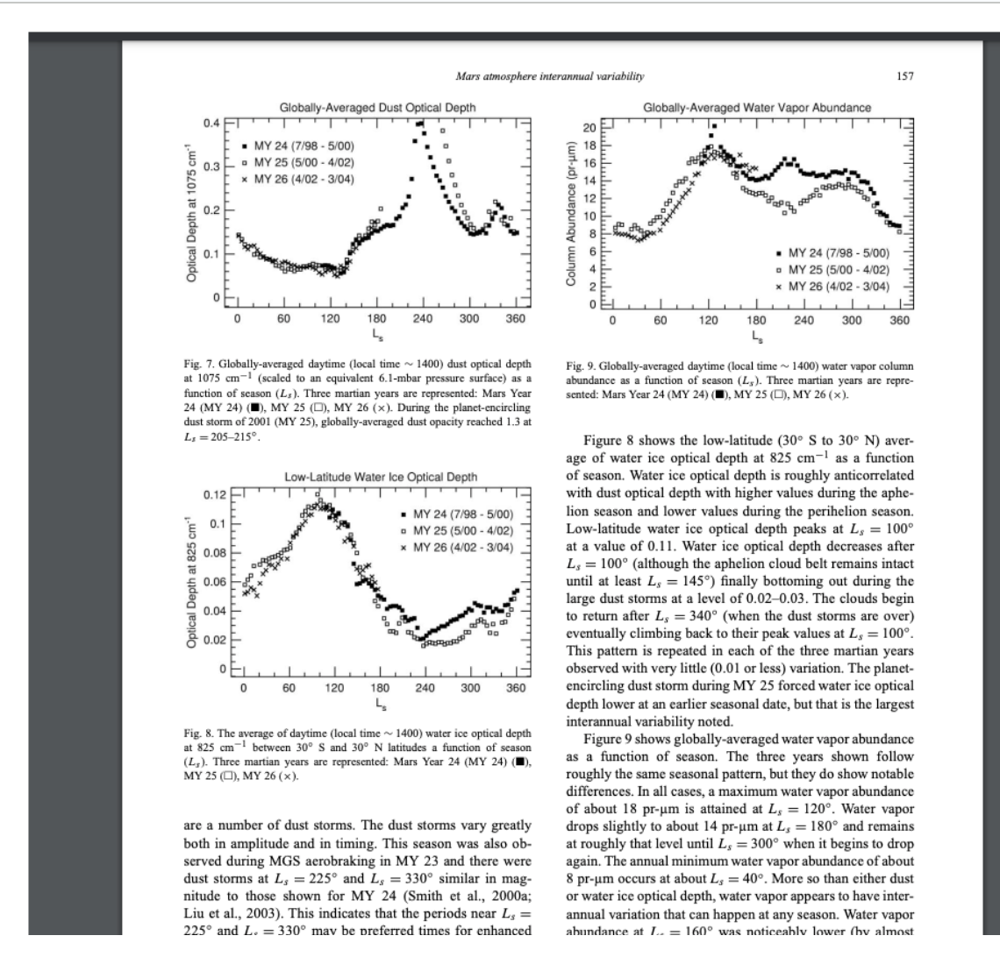

In [43]:
bins = [x for x in range(0, 360, 4)]
labels = [x for x in range(0, 360)]
print(bins)

[0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56, 60, 64, 68, 72, 76, 80, 84, 88, 92, 96, 100, 104, 108, 112, 116, 120, 124, 128, 132, 136, 140, 144, 148, 152, 156, 160, 164, 168, 172, 176, 180, 184, 188, 192, 196, 200, 204, 208, 212, 216, 220, 224, 228, 232, 236, 240, 244, 248, 252, 256, 260, 264, 268, 272, 276, 280, 284, 288, 292, 296, 300, 304, 308, 312, 316, 320, 324, 328, 332, 336, 340, 344, 348, 352, 356]


In [45]:
df_day['ls_bins'] = pd.cut(df_day['l_sub_s'], bins = bins, labels = bins[1:])
df_night['ls_bins'] = pd.cut(df_night['l_sub_s'], bins = bins, labels = bins[1:])

In [46]:
df_day['ls_bins'].value_counts()

ls_bins
176    5698
196    5483
200    5244
184    5110
208    5045
       ... 
36        0
32        0
28        0
24        0
356       0
Name: count, Length: 89, dtype: int64

Text(0.5, 1.0, 'Day: Averaged BD over Ls: bin size = 4')

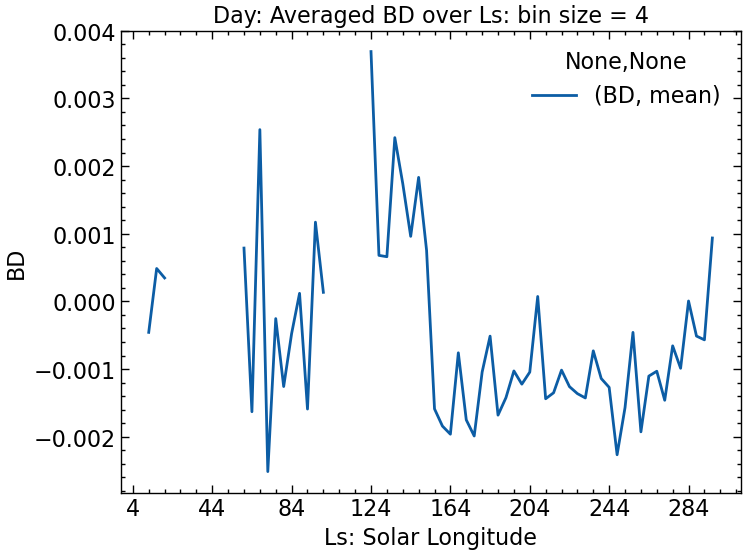

In [47]:
df_day[['ls_bins', 'BD']].groupby(by='ls_bins', observed=False).agg(['mean']).plot()
plt.xlabel('Ls: Solar Longitude')
plt.ylabel('BD')
plt.title('Day: Averaged BD over Ls: bin size = 4')

Text(0.5, 1.0, 'Night: Averaged BD over Ls: bin size = 4')

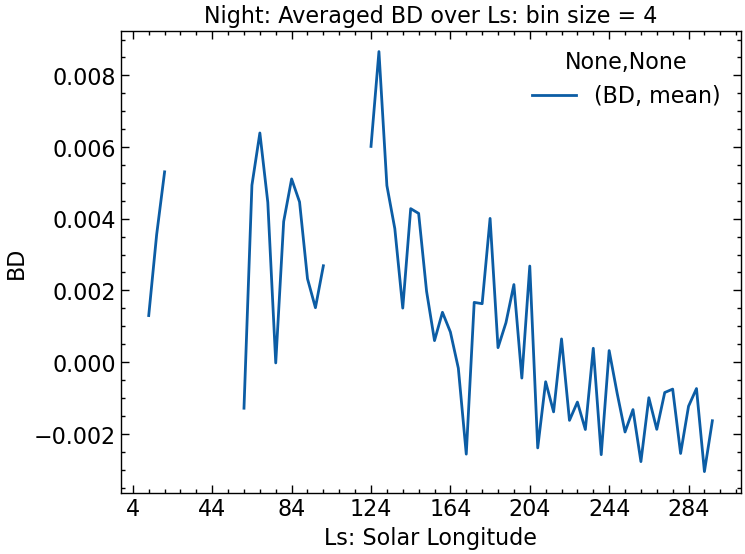

In [48]:
df_night[['ls_bins', 'BD']].groupby(by='ls_bins', observed=False).agg(['mean']).plot()
plt.xlabel('Ls: Solar Longitude')
plt.ylabel('BD')
plt.title('Night: Averaged BD over Ls: bin size = 4')

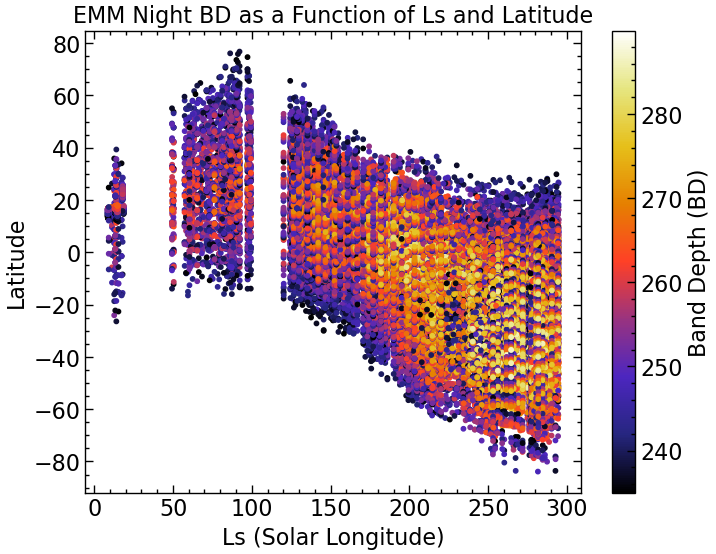

In [56]:
# smith plot for BD - Latitude
plt.scatter(df_night['l_sub_s'], df_night['latitude'], c=df_night['tsurf'], cmap='CMRmap', s=10)
plt.colorbar(label='Band Depth (BD)')
plt.xlabel('Ls (Solar Longitude)') # Ls (Solar 
plt.ylabel('Latitude')
plt.title('EMM Night BD as a Function of Ls and Latitude')
plt.show()

# CONCLUSION


-  we don't find any clear patterns with the BD to indicate a detection of Methane
-  It seems like there is a small resemblance to water vapour plots from the 2021 paper, but the similarity does not look significant. 

# Future Action

- Calculate the Upper Limit of Methane using BD 

